# Data loading and merging

## Prepare

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import pandas as pd
import math
import random
import sys

In [5]:
#IO operation
def load_variable(filename):
   f=open(filename,'rb')
   r=pickle.load(f)
   f.close()
   return r
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)
    f.close()
    return filename
def readdata(filename1,filename2):
    filename1 = load_variable(f'{filename1}.txt') 
    filename2 = load_variable(f'{filename2}.txt')
    filename1 = np.array(filename1)#单日各网格交通量累计361天(361,495,436,8)
    filename2 = np.array(filename2)#单日全网络交通量累计361天(361,4)  
    print(f"Grid is read successfully and the dimension of the data is:{filename1.shape}")
    print(f"Network is read successfully and the dimension of the data is:{filename2.shape}")
    return filename1,filename2

In [6]:
#IO operation
def load_variable(filename):
   f=open(filename,'rb')
   r=pickle.load(f)
   f.close()
   return r
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)
    f.close()
    return filename
def readdata(filename1,filename2):
    filename1 = load_variable(f'{filename1}.txt') 
    filename2 = load_variable(f'{filename2}.txt')
    filename1 = np.array(filename1)#单日各网格交通量累计361天(361,495,436,8)
    filename2 = np.array(filename2)#单日全网络交通量累计361天(361,4)  
    print(f"Grid is read successfully and the dimension of the data is:{filename1.shape}")
    print(f"Network is read successfully and the dimension of the data is:{filename2.shape}")
    return filename1,filename2

In [7]:
def Plotdata(single_grid,city_name):
    """
    The input should be a single grid 
    And the city_name shoule be a str type
    """
    title=["Northeast","Southeast","Southwest","Northwest"]
    city_name=city_name
    figure, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 8), dpi=300)
    for i in range (4):
        axes[int(i/2),int(i%2)].plot(single_grid[:,i], linewidth=1)            #int(0/2),int(0%2)=(0,0)
        axes[int(i/2),int(i%2)].set_ylabel("Traffic Volume (veh)")                              #int(1/2),int(1%2)=(0,1)
        axes[int(i/2),int(i%2)].set_xlabel("time-step (day)")                          #int(2/2),int(2%2)=(1,0)     
        axes[int(i/2),int(i%2)].set_title(f"{city_name}, direction: {title[i]}",fontsize=10) #int(3/2),int(3%2)=(1)
    plt.show()

## 1. Data loading

In [8]:
ANTWERP_Grid,ANTWERP_Network=readdata("/Users/psyche910/Desktop/Master.1/thesis/paper code/data/ANTWERP_Grid","/Users/psyche910/Desktop/Master.1/thesis/paper code/data/ANTWERP_Network")
BANGKOK_Grid,BANGKOK_Network=readdata("/Users/psyche910/Desktop/Master.1/thesis/paper code/data/BANGKOK_Grid","/Users/psyche910/Desktop/Master.1/thesis/paper code/data/BANGKOK_Network")
BARCELONA_Grid,BARCELONA_Network=readdata("/Users/psyche910/Desktop/Master.1/thesis/paper code/data/BARCELONA_Grid","/Users/psyche910/Desktop/Master.1/thesis/paper code/data/BARCELONA_Network")

Grid is read successfully and the dimension of the data is:(361, 495, 436, 8)
Network is read successfully and the dimension of the data is:(361, 4)
Grid is read successfully and the dimension of the data is:(361, 495, 436, 8)
Network is read successfully and the dimension of the data is:(361, 4)
Grid is read successfully and the dimension of the data is:(361, 495, 436, 8)
Network is read successfully and the dimension of the data is:(361, 4)


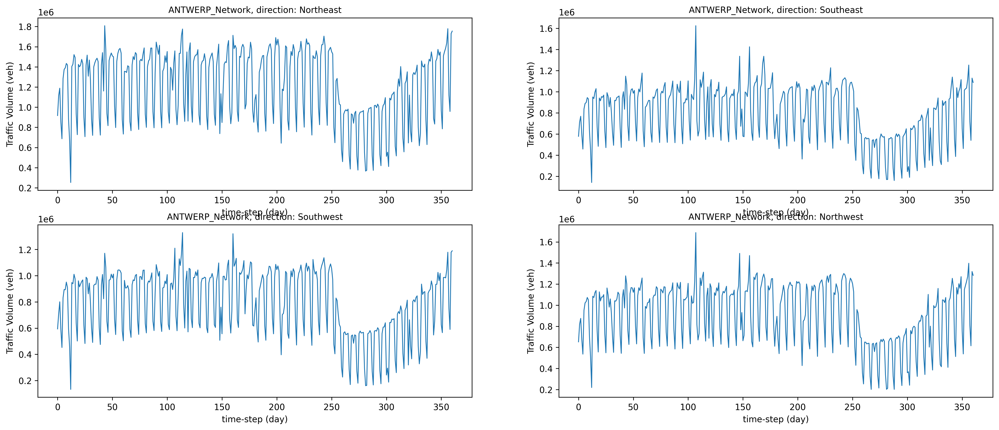

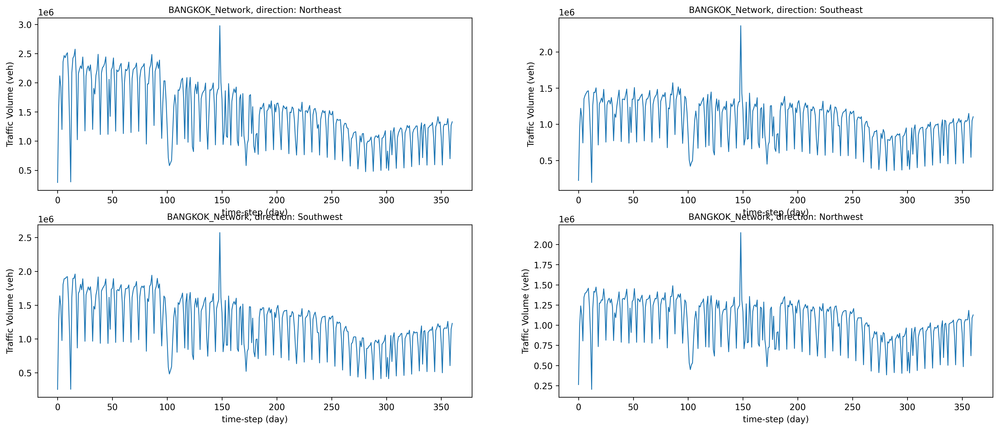

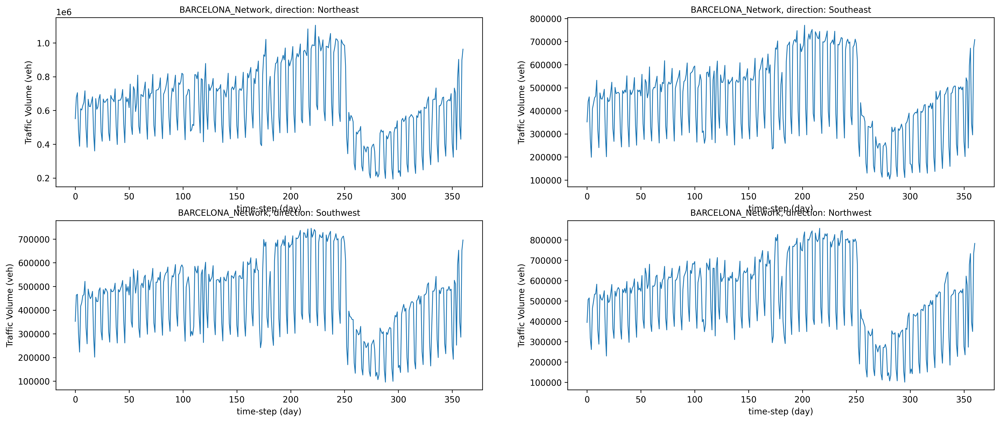

In [9]:
#total network situation
Plotdata(ANTWERP_Network,"ANTWERP_Network")
Plotdata(BANGKOK_Network,"BANGKOK_Network")
Plotdata(BARCELONA_Network,"BARCELONA_Network")

In [10]:
def Plot_network(network, city_name):
    """
    The input should be a single grid 
    And the city_name should be a str type
    """
    # Creating dates
    dates1 = pd.date_range('2019-01-02', '2019-06-30')
    dates2 = pd.date_range('2020-01-02', '2020-06-30')
    dates = dates1.union(dates2)
    date = pd.DatetimeIndex.to_frame(dates)
    date[0] = date[0].dt.date  # Only day and year 
    x = range(361)
    
    # Data 
    data = np.sum(network, axis=1)/10**6
    
    # Plot
    plt.figure(figsize=(20, 8), dpi=300)
    plt.plot(data, linewidth=3)           
    plt.ylabel("Traffic volume ($10^6$ vehs)", fontsize=30)                          
    plt.xlabel("Time step (day)", fontsize=30)    
    
    # Label
    plt.xticks(x[::30], date[0][::30], fontsize=23, rotation=30)
    plt.yticks(fontsize=30)

    # Adjust the fontsize of the offset text (for scientific notation)
    plt.gca().yaxis.get_offset_text().set_fontsize(25)

    plt.xlim(0, 361)
    plt.axvline(x=180, ls='--', c='royalblue', linewidth=2)
    plt.title(f"{city_name} traffic volume", fontsize=30)
    plt.text(118,1.2, 'Pre-pandemic',fontsize=27,c="blue");
    plt.text(182,1.2, 'During-pandemic',fontsize=27,c="blue");
    
    plt.savefig("ANTWERP.pdf",dpi=300,bbox_inches = 'tight')
    plt.show()

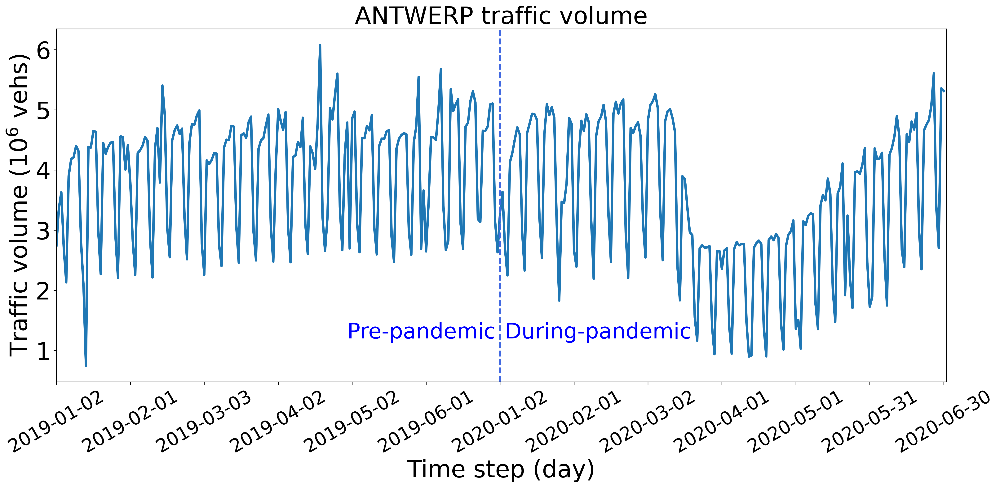

In [11]:
Plot_network(ANTWERP_Network,"ANTWERP")

In [12]:
def Plot_network(network, city_name):
    """
    The input should be a single grid 
    And the city_name should be a str type
    """
    # Creating dates
    dates1 = pd.date_range('2019-01-02', '2019-06-30')
    dates2 = pd.date_range('2020-01-02', '2020-06-30')
    dates = dates1.union(dates2)
    date = pd.DatetimeIndex.to_frame(dates)
    date[0] = date[0].dt.date  # Only day and year 
    x = range(361)
    
    # Data 
    data = np.sum(network, axis=1)/10**6
    
    # Plot
    plt.figure(figsize=(20, 8), dpi=300)
    plt.plot(data, linewidth=3)           
    plt.ylabel("Traffic volume ($10^6$ vehs)", fontsize=20)                          
    plt.xlabel("Time step (day)", fontsize=20)    
    
    # Label
    plt.xticks(x[::30], date[0][::30], fontsize=15, rotation=30)
    plt.yticks(fontsize=15)

    # Adjust the fontsize of the offset text (for scientific notation)
    plt.gca().yaxis.get_offset_text().set_fontsize(15)

    plt.xlim(0, 361)
    plt.axvline(x=180, ls='--', c='royalblue', linewidth=2)
    plt.title(f"{city_name} traffic volume", fontsize=20)
    plt.text(125, 1.5, 'Pre-pandemic',fontsize=20,c="blue");
    plt.text(190, 1.5, 'During-pandemic',fontsize=20,c="blue");

    plt.savefig("BANGKOK.pdf",dpi=300,bbox_inches = 'tight')
    plt.show()

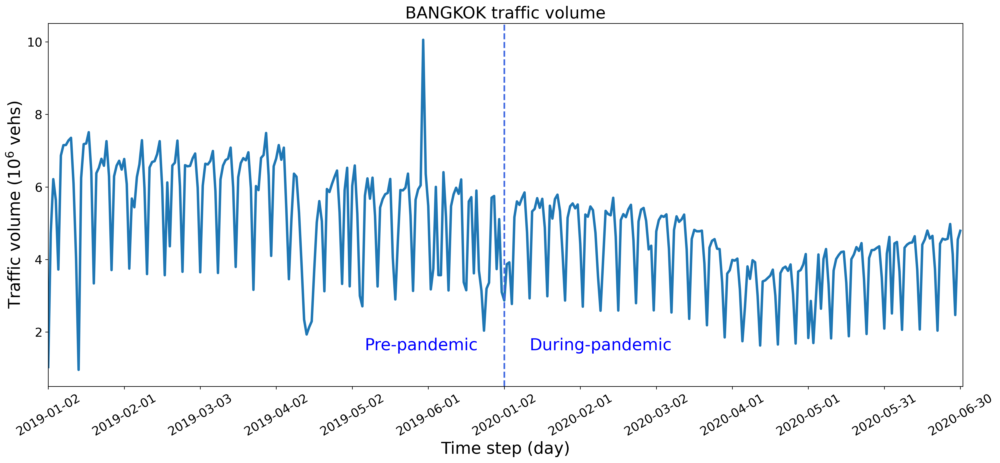

In [13]:
Plot_network(BANGKOK_Network,"BANGKOK")

In [14]:
def Plot_network(network, city_name):
    """
    The input should be a single grid 
    And the city_name should be a str type
    """
    # Creating dates
    dates1 = pd.date_range('2019-01-02', '2019-06-30')
    dates2 = pd.date_range('2020-01-02', '2020-06-30')
    dates = dates1.union(dates2)
    date = pd.DatetimeIndex.to_frame(dates)
    date[0] = date[0].dt.date  # Only day and year 
    x = range(361)
    
    # Data 
    data = np.sum(network, axis=1)/10**6
    
    # Plot
    plt.figure(figsize=(20, 8), dpi=300)
    plt.plot(data, linewidth=3)           
    plt.ylabel("Traffic volume ($10^6$ vehs)", fontsize=20)                          
    plt.xlabel("Time step (day)", fontsize=20)    
    
    # Label
    plt.xticks(x[::30], date[0][::30], fontsize=15, rotation=30)
    plt.yticks(fontsize=15)

    # Adjust the fontsize of the offset text (for scientific notation)
    plt.gca().yaxis.get_offset_text().set_fontsize(15)

    plt.xlim(0, 361)
    plt.axvline(x=180, ls='--', c='royalblue', linewidth=2)
    plt.title(f"{city_name} traffic volume", fontsize=20)
    plt.text(125, 0.7, 'Pre-pandemic',fontsize=20,c="blue");
    plt.text(190, 0.7, 'During-pandemic',fontsize=20,c="blue");

    plt.savefig("BARCELONA.pdf",dpi=300,bbox_inches = 'tight')
    plt.show()

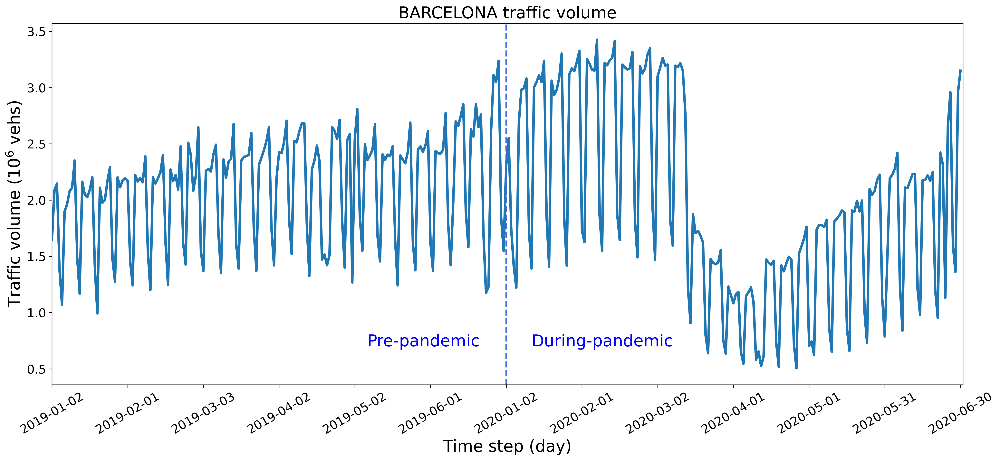

In [15]:
Plot_network(BARCELONA_Network,"BARCELONA")

## 2. Data merging 

In [16]:
#Grid merge
def Merge(Grid,a,b):#要把axb个小 grid 合并成一个大 grid。
    """
    The input should be a 4-dimension grids data (Time,Height,Width,Variables)
    a is the Height of a single grid after the merge, which  should be choose in (1，3，5，9，11，15，33，45，55，99，165，495)
    b is the Width of a single grid after the merge, which  should be choose in (1，2，4，109，218，436)
    a should be one of the factors of height
    b should be one of the factors of width
    After the merge the shape of data will be (x,y,361,8)
    x=Heigh/a , y=Width/b
    each (x,y) contains a sequence data,with shape(361,8)
    """
    Grid_temp=np.zeros([int(len(Grid[1])/a),int(len(Grid[1][1])/b)])#创建聚合后网络
    Grid_temp=Grid_temp.tolist()
    for i in range(0,int(len(Grid[1])),a):
        for j in range (0,int(len(Grid[1][1])),b):##按块扫描整个城市
            Grid_temp[int(i/a)][int(j/b)]=(Grid[:,i:i+a,j:j+b,:].sum(axis=(1,2)))
            #取一个 a×b 的空间区域，然后把这个区域里的所有小 grid 求和，只对空间维度求和，没有对时间求和，所以：361 天的信息还保留只是空间被压缩了
            #因此 merge 后的数据，本质上就从：“路口级交通”变成：“区域级交通”。
            #每一个grid是一个(361,8)矩阵，就变成了（496/a，436/b，361，8）
    Grid_temp=np.array(Grid_temp)
    print(f"The shape of the input grid data  has been from {Grid.shape} change into {Grid_temp.shape}\n")
    return Grid_temp

In [17]:
def Volume(Grid):
    Grid_temp=Grid[:,:,:,0:-1:2]
    print(f"The shape of the input grid data  has been from {Grid.shape} change into {Grid_temp.shape}\n")
    return Grid_temp

In [18]:
ANTWERP_Merge=Merge(ANTWERP_Grid,1,1)
ANTWERP_Merge=Volume(ANTWERP_Merge)

The shape of the input grid data  has been from (361, 495, 436, 8) change into (495, 436, 361, 8)

The shape of the input grid data  has been from (495, 436, 361, 8) change into (495, 436, 361, 4)



In [19]:
BANGKOK_Merge=Merge(BANGKOK_Grid,1,1)
BANGKOK_Merge=Volume(BANGKOK_Merge)

The shape of the input grid data  has been from (361, 495, 436, 8) change into (495, 436, 361, 8)

The shape of the input grid data  has been from (495, 436, 361, 8) change into (495, 436, 361, 4)



In [20]:
BARCELONA_Merge=Merge(BARCELONA_Grid,1,1)
BARCELONA_Merge=Volume(BARCELONA_Merge)

The shape of the input grid data  has been from (361, 495, 436, 8) change into (495, 436, 361, 8)

The shape of the input grid data  has been from (495, 436, 361, 8) change into (495, 436, 361, 4)



## Data cleaning

In [21]:
#看不同节点过滤掉多少数据（用灾前正常期判断）
for city_name, merge in [("ANTWERP", ANTWERP_Merge), 
                          ("BANGKOK", BANGKOK_Merge), 
                          ("BARCELONA", BARCELONA_Merge)]:
    nodes = merge.reshape(495*436, 361, 4)
    
    # 灾前180天，4方向volume加总均值
    pre_event = nodes[:, :180, :].mean(axis=1).sum(axis=-1)  # (215820,)
    
    # 只在edge_indices出现过的节点里统计
    edge = load_variable(f"/Users/psyche910/Desktop/Master.1/thesis/paper code/01 data reading/{city_name}_edge_indices")
    valid_ids = np.unique(edge)
    valid_vol = pre_event[valid_ids]
    
    print(f"{city_name}: 有道路节点={len(valid_ids)}")
    for p in [10, 20, 30, 40, 50]:
        threshold = np.percentile(valid_vol, p)
        removed = (valid_vol < threshold).sum()
        kept = len(valid_ids) - removed
        print(f"  {p}%分位 threshold={threshold:.1f}  去掉={removed}  保留={kept} ({kept/len(valid_ids)*100:.1f}%)")
    print()

ANTWERP: 有道路节点=119148
  10%分位 threshold=0.0  去掉=11140  保留=108008 (90.7%)
  20%分位 threshold=0.1  去掉=23806  保留=95342 (80.0%)
  30%分位 threshold=0.5  去掉=35726  保留=83422 (70.0%)
  40%分位 threshold=1.5  去掉=47630  保留=71518 (60.0%)
  50%分位 threshold=3.2  去掉=59563  保留=59585 (50.0%)

BANGKOK: 有道路节点=182819
  10%分位 threshold=0.0  去掉=17217  保留=165602 (90.6%)
  20%分位 threshold=0.1  去掉=36563  保留=146256 (80.0%)
  30%分位 threshold=0.3  去掉=54527  保留=128292 (70.2%)
  40%分位 threshold=0.6  去掉=73008  保留=109811 (60.1%)
  50%分位 threshold=1.3  去掉=91401  保留=91418 (50.0%)

BARCELONA: 有道路节点=103708
  10%分位 threshold=0.0  去掉=0  保留=103708 (100.0%)
  20%分位 threshold=0.0  去掉=19506  保留=84202 (81.2%)
  30%分位 threshold=0.1  去掉=30948  保留=72760 (70.2%)
  40%分位 threshold=0.4  去掉=41441  保留=62267 (60.0%)
  50%分位 threshold=1.2  去掉=51833  保留=51875 (50.0%)



In [22]:
## 3. Data cleaning
DATA_PATH = "/Users/psyche910/Desktop/Master.1/thesis/paper code/01 data reading"
SAVE_PATH = "/Users/psyche910/Desktop/Master.1/thesis/paper code/02 data processing"

LOW_THRESHOLD   = 30   # remove nodes with pre-event mean volume <= 30 veh/day (4 dir summed)
HIGH_PERCENTILE = 99   # remove nodes above 99th percentile (extreme outliers)

def clean_nodes(merge, city_name, low_thresh=LOW_THRESHOLD, high_pct=HIGH_PERCENTILE):
    # (495, 436, 361, 4) → (215820, 361, 4)
    nodes = merge.reshape(495*436, 361, 4)

    # Pre-event mean volume (4 directions summed)
    pre_event_mean = nodes[:, :180, :].mean(axis=1).sum(axis=-1)  # (215820,)

    # Lower bound: remove low-traffic nodes
    low_mask = pre_event_mean > low_thresh

    # Upper bound: remove extreme outliers (above 99th percentile of remaining nodes)
    high_thresh = np.percentile(pre_event_mean[low_mask], high_pct)
    mask = low_mask & (pre_event_mean <= high_thresh)

    active_nodes = nodes[mask]  # keep all 361 days

    print(f"{city_name}: {mask.sum()} / {495*436} nodes kept ({mask.mean()*100:.1f}%)")
    print(f"  Low threshold  = {low_thresh} veh/day")
    print(f"  High threshold = {high_thresh:.1f} veh/day (99th percentile)")
    return active_nodes, mask

def clean_edges(mask, city_name):
    edge = load_variable(f"{DATA_PATH}/{city_name}_edge_indices")
    src, dst = edge[0], edge[1]

    valid = mask[src] & mask[dst]

    id_map = np.full(495*436, -1)
    id_map[mask] = np.arange(mask.sum())
    new_edges = np.stack([id_map[src[valid]], id_map[dst[valid]]])

    print(f"  Edges: {edge.shape[1]} → {new_edges.shape[1]}")
    return new_edges

In [23]:
for city_name, merge in [("ANTWERP",   ANTWERP_Merge),
                          ("BANGKOK",   BANGKOK_Merge),
                          ("BARCELONA", BARCELONA_Merge)]:
    active_nodes, mask = clean_nodes(merge, city_name)
    new_edges = clean_edges(mask, city_name)

    save_variable(active_nodes, f"{SAVE_PATH}/{city_name}_nodes_clean.txt")
    save_variable(new_edges,    f"{SAVE_PATH}/{city_name}_edges_clean.txt")
    save_variable(mask,         f"{SAVE_PATH}/{city_name}_node_mask.txt")
    print(f"  Saved: nodes={active_nodes.shape}, edges={new_edges.shape}\n")

ANTWERP: 21899 / 215820 nodes kept (10.1%)
  Low threshold  = 30 veh/day
  High threshold = 1145.1 veh/day (99th percentile)
  Edges: 517884 → 65169
  Saved: nodes=(21899, 361, 4), edges=(2, 65169)

BANGKOK: 26018 / 215820 nodes kept (12.1%)
  Low threshold  = 30 veh/day
  High threshold = 1084.5 veh/day (99th percentile)
  Edges: 938502 → 85414
  Saved: nodes=(26018, 361, 4), edges=(2, 85414)

BARCELONA: 15638 / 215820 nodes kept (7.2%)
  Low threshold  = 30 veh/day
  High threshold = 535.8 veh/day (99th percentile)
  Edges: 504770 → 54604
  Saved: nodes=(15638, 361, 4), edges=(2, 54604)




=== ANTWERP === total nodes: 21899
  mean range: 15.3 ~ 1622.8


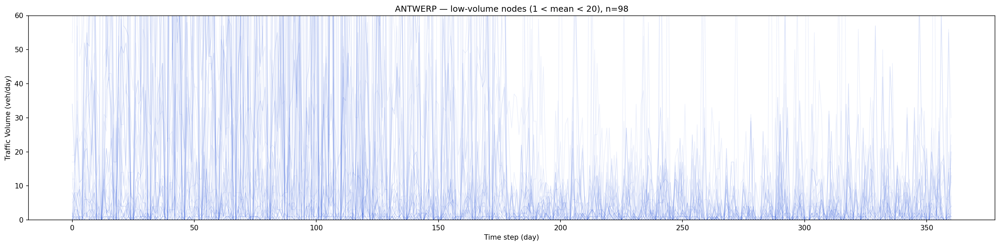

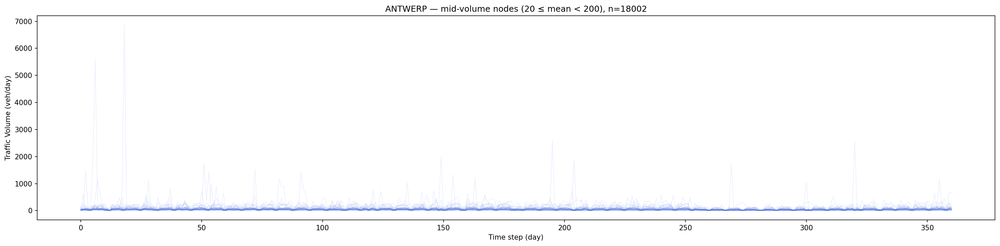


=== BANGKOK === total nodes: 26018
  mean range: 15.0 ~ 1311.8


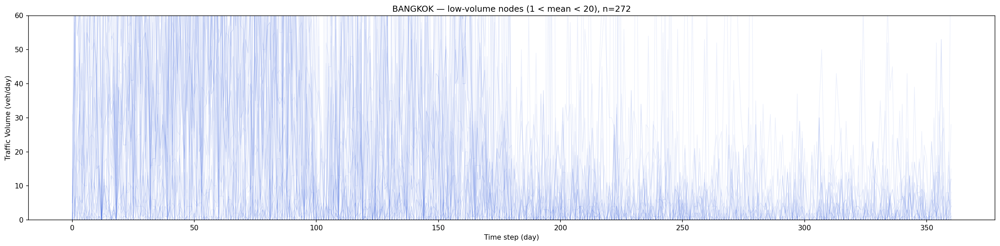

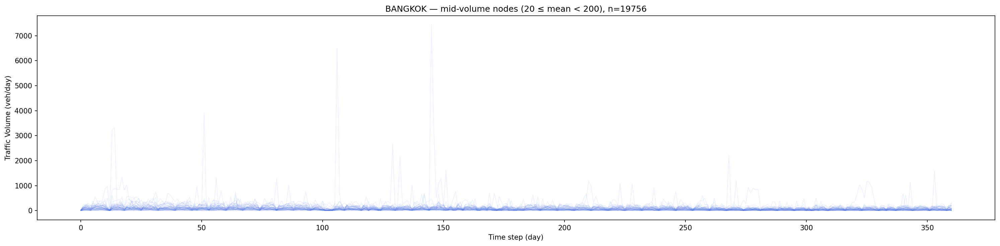


=== BARCELONA === total nodes: 15638
  mean range: 15.1 ~ 2281.4


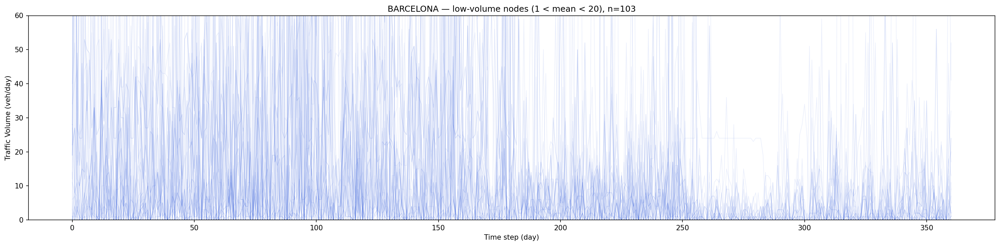

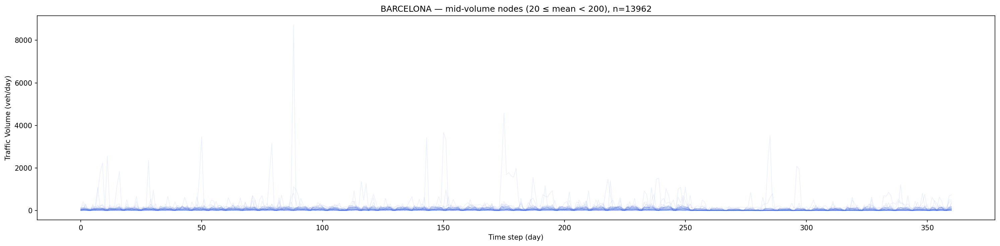

In [24]:
# Visualize cleaned nodes: sample time series at different mean ranges
for city_name in ["ANTWERP", "BANGKOK", "BARCELONA"]:
    nodes = load_variable(f"{SAVE_PATH}/{city_name}_nodes_clean.txt")  # (N, 361, 4)
    vol = nodes.sum(axis=-1)  # (N, 361) — sum 4 directions
    means = vol.mean(axis=1)  # (N,)

    print(f"\n=== {city_name} === total nodes: {len(nodes)}")
    print(f"  mean range: {means.min():.1f} ~ {means.max():.1f}")

    # Low-volume samples
    idx_low = np.where((means > 1) & (means < 20))[0]
    if len(idx_low) > 0:
        sample = idx_low[np.random.randint(0, len(idx_low), min(50, len(idx_low)))]
        plt.figure(figsize=(20, 5), dpi=150)
        for i in sample:
            plt.plot(vol[i], "royalblue", alpha=0.1, linewidth=0.8)
        plt.ylim(0, 60)
        plt.ylabel("Traffic Volume (veh/day)")
        plt.xlabel("Time step (day)")
        plt.title(f"{city_name} — low-volume nodes (1 < mean < 20), n={len(idx_low)}")
        plt.tight_layout()
        plt.show()

    # Mid-volume samples
    idx_mid = np.where((means >= 20) & (means < 200))[0]
    if len(idx_mid) > 0:
        sample = idx_mid[np.random.randint(0, len(idx_mid), min(50, len(idx_mid)))]
        plt.figure(figsize=(20, 5), dpi=150)
        for i in sample:
            plt.plot(vol[i], "royalblue", alpha=0.1, linewidth=0.8)
        plt.ylabel("Traffic Volume (veh/day)")
        plt.xlabel("Time step (day)")
        plt.title(f"{city_name} — mid-volume nodes (20 ≤ mean < 200), n={len(idx_mid)}")
        plt.tight_layout()
        plt.show()


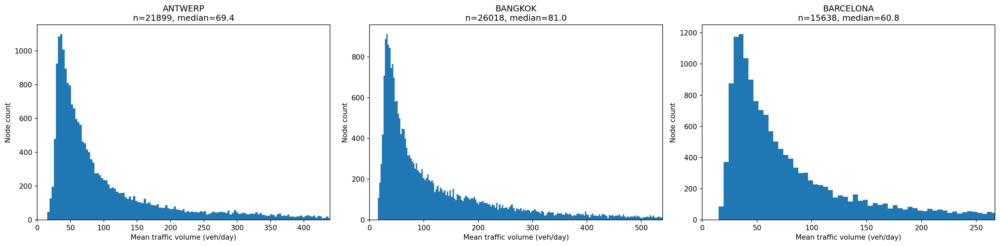

In [25]:
# Histogram of mean traffic volume per city
fig, axes = plt.subplots(1, 3, figsize=(20, 5), dpi=150)

for ax, city_name in zip(axes, ["ANTWERP", "BANGKOK", "BARCELONA"]):
    nodes = load_variable(f"{SAVE_PATH}/{city_name}_nodes_clean.txt")
    means = nodes.sum(axis=-1).mean(axis=1)

    ax.hist(means, bins=500)
    ax.set_xlim(0, np.percentile(means, 95))
    ax.set_xlabel("Mean traffic volume (veh/day)")
    ax.set_ylabel("Node count")
    ax.set_title(f"{city_name}\nn={len(means)}, median={np.median(means):.1f}")

plt.tight_layout()
plt.show()


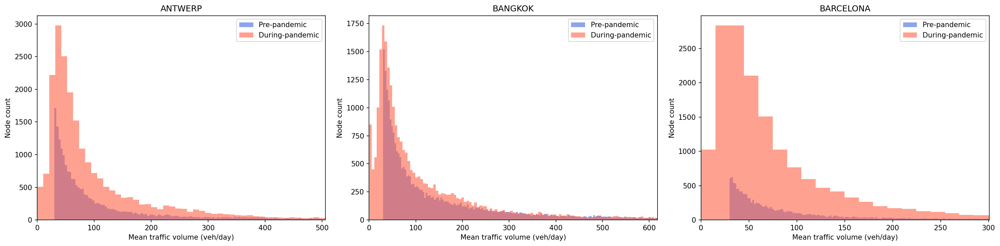

In [26]:
# Pre vs during pandemic mean comparison
fig, axes = plt.subplots(1, 3, figsize=(20, 5), dpi=150)

for ax, city_name in zip(axes, ["ANTWERP", "BANGKOK", "BARCELONA"]):
    nodes = load_variable(f"{SAVE_PATH}/{city_name}_nodes_clean.txt")
    vol = nodes.sum(axis=-1)  # (N, 361)

    pre  = vol[:, :180].mean(axis=1)
    post = vol[:, 180:].mean(axis=1)

    ax.hist(pre,  bins=300, alpha=0.6, label="Pre-pandemic",    color="royalblue")
    ax.hist(post, bins=300, alpha=0.6, label="During-pandemic", color="tomato")
    ax.set_xlim(0, np.percentile(pre, 95))
    ax.set_xlabel("Mean traffic volume (veh/day)")
    ax.set_ylabel("Node count")
    ax.set_title(city_name)
    ax.legend()

plt.tight_layout()
plt.show()
